In [2]:
import cv2
import os
import glob
import pickle
from tqdm import tqdm
import numpy as np

In [3]:
!wget -c --progress=bar:force http://data.csail.mit.edu/places/places365/test_256.tar -O du_lieu.tar

--2025-08-26 06:37:26--  http://data.csail.mit.edu/places/places365/test_256.tar
Resolving data.csail.mit.edu (data.csail.mit.edu)... 128.52.131.233
Connecting to data.csail.mit.edu (data.csail.mit.edu)|128.52.131.233|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://data.csail.mit.edu/places/places365/test_256.tar [following]
--2025-08-26 06:37:26--  https://data.csail.mit.edu/places/places365/test_256.tar
Connecting to data.csail.mit.edu (data.csail.mit.edu)|128.52.131.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4736829440 (4.4G) [application/x-tar]
Saving to: ‘du_lieu.tar’

du_lieu.tar         100%[===================>]   4.41G  20.3MB/s    in 3m 56s  

2025-08-26 06:41:23 (19.1 MB/s) - ‘du_lieu.tar’ saved [4736829440/4736829440]



In [4]:
mkdir -p /kaggle/working//dataset

In [5]:
!tar -xf /kaggle/working/du_lieu.tar -C /kaggle/working//dataset

In [6]:
#xóa file .tar để tối ưu bộ nhớ
!rm /kaggle/working/du_lieu.tar

**Pre-processing và đưa tất cả ảnh về HSV**

In [7]:
def split_hsv_img(img_path):
    img = cv2.imread(img_path)
    img = cv2.resize(img, (224, 224))
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    return img_hsv[:, :, :2], img_hsv[:, :, 2]

In [8]:
X = []
y = []
count = 0

for path, dirs, files in os.walk('/kaggle/working/dataset/test_256'):
    for f in tqdm(glob.iglob(os.path.join(path, '*.jpg'))):
        count += 1
        hs, v = split_hsv_img(f)
        X.append(v)
        y.append(hs)
            
        if count%10000 == 0:
            with open('/kaggle/working/dataset/X_' + str(count//10000) + '.pkl', 'wb') as f:
                pickle.dump(X, f)
            with open('/kaggle/working/dataset/y_' + str(count//10000) + '.pkl', 'wb') as f:
                pickle.dump(y, f)
            print(count//10000, np.shape(X), np.shape(y))
            del X, y
            X = []
            y = []

10001it [00:31, 17.07it/s] 

1 (10000, 224, 224) (10000, 224, 224, 2)


20220it [00:56, 35.66it/s]  

2 (10000, 224, 224) (10000, 224, 224, 2)


30132it [01:20, 29.95it/s]  

3 (10000, 224, 224) (10000, 224, 224, 2)


40125it [01:44, 35.67it/s]  

4 (10000, 224, 224) (10000, 224, 224, 2)


50061it [02:09, 28.92it/s]  

5 (10000, 224, 224) (10000, 224, 224, 2)


60063it [02:37, 20.26it/s]  

6 (10000, 224, 224) (10000, 224, 224, 2)


70072it [03:08, 18.30it/s] 

7 (10000, 224, 224) (10000, 224, 224, 2)


80047it [03:43, 13.01it/s] 

8 (10000, 224, 224) (10000, 224, 224, 2)


90054it [04:20, 14.59it/s] 

9 (10000, 224, 224) (10000, 224, 224, 2)


100053it [04:54, 13.15it/s]

10 (10000, 224, 224) (10000, 224, 224, 2)


109999it [05:17, 346.04it/s]


OSError: [Errno 28] No space left on device

In [9]:
!rm -rf /kaggle/working/dataset/test_256

In [10]:

import pickle

def load_data(i):
    with open('/kaggle/working/dataset/X_'+str(i)+'.pkl', 'rb') as f:
        images = pickle.load(f)

    with open('/kaggle/working/dataset/y_'+str(i)+'.pkl', 'rb') as f:
        gt_images = pickle.load(f)
    
    return images, gt_images

In [11]:

images_val, gt_images_val = load_data(10)

In [12]:
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras import applications

2025-08-26 06:56:08.685563: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756191368.881390      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756191368.939887      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
resnet = applications.resnet50.ResNet50(weights=None, classes=365)
resnet.summary()

I0000 00:00:1756191382.545954      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Trainable params: 24,282,477 (92.63 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
x = resnet.output
model_tmp = Model(inputs = resnet.input, outputs = x) 

In [ ]:
layer_3  = model_tmp.get_layer('conv2_block3_out').output   # stage 2
layer_7  = model_tmp.get_layer('conv3_block4_out').output   # stage 3
layer_13 = model_tmp.get_layer('conv4_block6_out').output   # stage 4
layer_16 = model_tmp.get_layer('conv5_block3_out').output   # stage 5 (cuối)


In [ ]:
fcn1 = Conv2D(filters=2 , kernel_size=1, name='fcn1')(layer_16)

fcn2 = Conv2DTranspose(filters=K.int_shape(layer_13)[-1], kernel_size=4, strides=2, padding='same', name='fcn2')(fcn1)
fcn2_skip_connected = Add(name="fcn2_plus_layer13")([fcn2, layer_13])

fcn3 = Conv2DTranspose(filters=K.int_shape(layer_7)[-1], kernel_size=4, strides=2, padding='same', name="fcn3")(fcn2_skip_connected)
fcn3_skip_connected = Add(name="fcn3_plus_layer_7")([fcn3, layer_7])

fcn4 = Conv2DTranspose(filters=K.int_shape(layer_3)[-1], kernel_size=4, strides=2, padding='same', name="fcn4")(fcn3_skip_connected)
fcn4_skip_connected = Add(name="fcn4_plus_layer_3")([fcn4, layer_3])

# Upsample to original size
fcn5 = Conv2DTranspose(filters=2, kernel_size=16, strides=(4, 4), padding='same', name="fcn5")(fcn4_skip_connected)
relu255 = ReLU(max_value=255)(fcn5)


In [ ]:
model = Model(inputs = resnet.input, outputs = relu255)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 34,243,204 (130.63 MB)

 Trainable params: 34,190,084 (130.42 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true)))
    

model.compile(loss=root_mean_squared_error, optimizer='rmsprop')

In [20]:
!mkdir /kaggle/working/model

mkdir: cannot create directory ‘/kaggle/working/model’: File exists


In [21]:
model.save('/kaggle/working/model/my_model.keras')

In [22]:
from random import randint
import cv2

def preprocessing_input_output(img, gt):
    img_n = img.copy()
    img_n = cv2.cvtColor(img_n, cv2.COLOR_GRAY2BGR)
  
    return img_n, gt

In [23]:
import numpy as np
from keras.utils import to_categorical

def image_batch_generator(images, gt_images, batch_size):
    while True:
        batch_paths = np.random.choice(a=len(images), size=batch_size)
        input = []
        output = []
        
        for i in batch_paths:
            in_p, out_p = preprocessing_input_output(images[i], gt_images[i])
            input.append(in_p)
            output.append(out_p)
        
        input = np.array(input)
        output = np.array(output)
        # output = np.array(np.expand_dims(output, -1))
        yield(input, output)

In [24]:
!mkdir /kaggle/working/checkpoint

In [25]:
from keras.callbacks import ModelCheckpoint

filepath = '/kaggle/working/checkpoint/colorization_12_1.weights.h5'
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, save_weights_only=True, mode='min')
callbacks_list = [checkpoint]

In [38]:
batch_size = 32

for i in range(0, 20):
    i = np.random.randint(1, 9)
    images, gt_images = load_data(i)
    model.fit(image_batch_generator(images, gt_images, batch_size),
                       steps_per_epoch=len(images)//batch_size,
                       epochs=5,
                       verbose=1,
                       validation_data=image_batch_generator(images_val, gt_images_val, batch_size),
                       validation_steps=len(images_val)//batch_size,
                       callbacks=callbacks_list)
    del images, gt_images

model.load_weights(filepath)

Epoch 1/5
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step - loss: 52.0052
Epoch 1: loss did not improve from 43.41999
312/312 ━━━━━━━━━━━━━━━━━━━━ 96s 307ms/step - loss: 52.0039 - val_loss: 53.8177
Epoch 2/5
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - loss: 50.7241
Epoch 2: loss did not improve from 43.41999
312/312 ━━━━━━━━━━━━━━━━━━━━ 96s 308ms/step - loss: 50.7228 - val_loss: 56.5389
Epoch 3/5
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - loss: 49.0974
Epoch 3: loss did not improve from 43.41999
312/312 ━━━━━━━━━━━━━━━━━━━━ 96s 308ms/step - loss: 49.0968 - val_loss: 65.5584
Epoch 4/5
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - loss: 48.0973
Epoch 4: loss did not improve from 43.41999
312/312 ━━━━━━━━━━━━━━━━━━━━ 96s 308ms/step - loss: 48.0963 - val_loss: 58.9366
Epoch 5/5
312/312 ━━━━━━━━━━━━━━━━━━━━ 0s 235ms/step - loss: 46.8103
Epoch 5: loss did not improve from 43.41999
312/312 ━━━━━━━━━━━━━━━━━━━━ 96s 308ms/step - loss: 46.8100 - val_loss: 68.7911
Epoch 1/5
312/312 ━━━━━━━━━━━━━━━━━

Exception ignored in: <function _xla_gc_callback at 0x7882313b71a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/jax/_src/lib/__init__.py", line 96, in _xla_gc_callback
    def _xla_gc_callback(*args):
    
KeyboardInterrupt: 
Exception ignored in: <function _xla_gc_callback at 0x7882313b71a0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/jax/_src/lib/__init__.py", line 96, in _xla_gc_callback
    def _xla_gc_callback(*args):
    
KeyboardInterrupt: 


Epoch 1/5
  3/312 ━━━━━━━━━━━━━━━━━━━━ 1:12 236ms/step - loss: 54.4720

KeyboardInterrupt: 

In [28]:
from matplotlib import pyplot as plt
import cv2
import numpy as np

In [29]:
def regenerate_img(gray, hs):
    img = np.zeros((224, 224, 3))
    img [:, :, 2] = gray #V
    img [:, :, 0] = hs[:, :, 0] #H
    img [:, :, 1] = hs[:, :, 1] #S
    
    img = np.array(img, np.uint8)
    img = cv2.cvtColor(img, cv2.COLOR_HSV2RGB) #Convert to RGB
    
    return img

In [30]:
def predict_hs(gray):
    img = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
    return model.predict(np.array([img]))[0]

In [41]:
index = np.random.choice(a=len(X), size=20)

In [42]:
grays = []
predicts = []
originals = []
for i in index:
    grays.append(X[i])
    predicts.append(regenerate_img(X[i], predict_hs(X[i])))
    originals.append(regenerate_img(X[i], y[i]))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


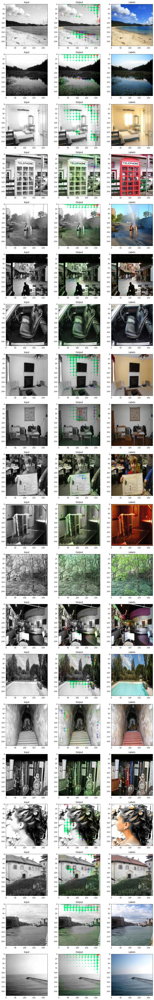

In [43]:
fig = plt.figure(figsize=(15, 15/3*len(grays)))
columns = 3
rows = len(grays)
show = []


for i in range(0, len(grays)):
    show.append( fig.add_subplot(rows, columns, i*3+1) )
    show[i*3].set_title("Input")  # set title
    plt.imshow(grays[i], cmap='gray')

    show.append( fig.add_subplot(rows, columns, i*3+2) )
    show[i*3+1].set_title("Output") 
    plt.imshow(predicts[i])

    show.append( fig.add_subplot(rows, columns, i*3+3) )
    show[i*3+2].set_title("Labels")
    plt.imshow(originals[i])

plt.show()

**KẾT LUẬN**

mô hình đã được tối ưu khi hàm loss đã dần hội tụ
điểm yếu là do tính bằng MSE nên màu của ảnh đã bị tính trung bình dẫn đến trường hợp 2 màu đối lập và khác biệt ở gần nhau thì nó sẽ tính ra trung bình của màu của cả ảnh đó dẫn đến màu ảnh vẫn chưa trân thực 

đề xuất: có thể chỉnh sửa hàm loss riêng biệt để tính toán cho lớp bài toán tô màu ảnh ví dụ bài báo: https://arxiv.org/pdf/1603.08511
đề xuất một hàm loss mới dành riêng cho bài toán tô màu

vấn đề tài nguyên còn hạn chế do kaggle cung cấp ổ cứng HDD chỉ có 19.5GB và 29GB nên việc tính toán còn gặp khó khăn mặc dù đã xử dụng GPU 100P nhưng gặp vấn đề tràn RAM và không thể sử dụng bộ dữ liệu lớn được cần cải thiện tài nguyên tính toán lớn hơn hoặc cần tối ưu mô hình